In [1]:
import sys
sys.path.append("../")

In [2]:
import pandas as pd
import plotly.graph_objects as go
from plotting import CandlePlot
import numpy as np
from simulation.donchian_multi_temporal_binance import DonchianMultiTemporalBinance
from technicals.indicators import Donchian_Close

from functools import reduce

In [3]:

from multiprocessing import Process, Manager
import pickle
import warnings
warnings.filterwarnings('ignore')

In [4]:

# def calculate_rsi(df, period=14):
#     # Calcula as diferenças dos preços de fechamento
#     df['Price Change'] = df['Close'].diff()
    
#     # Separa ganhos e perdas
#     df['Gain'] = df['Price Change'].apply(lambda x: x if x > 0 else 0)
#     df['Loss'] = df['Price Change'].apply(lambda x: -x if x < 0 else 0)
    
#     # Calcula as médias móveis exponenciais dos ganhos e perdas
#     avg_gain = df['Gain'].rolling(window=period).mean()
#     avg_loss = df['Loss'].rolling(window=period).mean()
    
#     # Calcula o RSI
#     rs = avg_gain / avg_loss
#     df['RSI'] = 100 - (100 / (1 + rs))
    
#     # Limpa colunas temporárias
#     df.drop(columns=['Price Change', 'Gain', 'Loss'], inplace=True)
    
#     return df




# def calculate_adx(df, period=14):
#     # Cálculo de +DM, -DM e TR
#     df['High-Low'] = df['High'] - df['Low']
#     df['High-Close'] = abs(df['High'] - df['Close'].shift(1))
#     df['Low-Close'] = abs(df['Low'] - df['Close'].shift(1))
    
#     df['TR'] = df[['High-Low', 'High-Close', 'Low-Close']].max(axis=1)
#     df['+DM'] = np.where((df['High'] - df['High'].shift(1)) > (df['Low'].shift(1) - df['Low']), 
#                          np.maximum(df['High'] - df['High'].shift(1), 0), 0)
#     df['-DM'] = np.where((df['Low'].shift(1) - df['Low']) > (df['High'] - df['High'].shift(1)), 
#                          np.maximum(df['Low'].shift(1) - df['Low'], 0), 0)
    
#     # Suavizando os valores de TR, +DM e -DM com média móvel exponencial
#     df['TR_smooth'] = df['TR'].rolling(window=period).sum()
#     df['+DM_smooth'] = df['+DM'].rolling(window=period).sum()
#     df['-DM_smooth'] = df['-DM'].rolling(window=period).sum()
    
#     # Cálculo de +DI e -DI
#     df['+DI'] = 100 * (df['+DM_smooth'] / df['TR_smooth'])
#     df['-DI'] = 100 * (df['-DM_smooth'] / df['TR_smooth'])
    
#     # Cálculo do DX
#     df['DX'] = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    
#     # Cálculo do ADX
#     df['ADX'] = df['DX'].rolling(window=period).mean()

#     # Limpando colunas temporárias
#     df.drop(columns=['High-Low', 'High-Close', 'Low-Close', 'TR', '+DM', '-DM', 'TR_smooth', '+DM_smooth', '-DM_smooth', 'DX'], inplace=True)

#     return df
    
# # Função para calcular a variação percentual acumulada
# def calculate_percent_change(close_prices, window):
#     percent_change = np.zeros(len(close_prices))

#     for i in range(window, len(close_prices)):
#         window_sum = 0.0
#         for j in range(i - window + 1, i + 1):
#             percent_change[j] = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
#             window_sum += percent_change[j]
#         percent_change[i] = window_sum

#     return percent_change


# Função para calcular a variação percentual acumulada com uma janela deslizante correta
def calculate_percent_change(close_prices, window):
    percent_change = np.zeros(len(close_prices))

    for i in range(window, len(close_prices)):
        window_sum = 0.0
        for j in range(i - window + 1, i + 1):
            # Calcula a variação percentual entre o ponto atual e o ponto anterior
            change = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
            window_sum += change
        # Atribui o valor acumulado da janela atual ao ponto final da janela
        percent_change[i] = window_sum

    return percent_change



# Função para calcular a EMA
def calculate_ema(values, period):
    ema = np.zeros(len(values))
    multiplier = 2 / (period + 1)
    ema[period - 1] = values[period - 1]  # O primeiro valor da EMA é igual ao valor inicial
    for i in range(period, len(values)):
        ema[i] = (values[i] - ema[i - 1]) * multiplier + ema[i - 1]
    return ema

# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_indicators(df, window=14, ema_period_1=10, ema_period_2=60):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    ema_1 = calculate_ema(percent_change, ema_period_1)
    ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # Adiciona os resultados ao DataFrame original
    df['Percent_Change'] = percent_change
    df['EMA_percent_s'] = ema_1
    df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return df


# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_emaper(df, window=14):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    # ema_1 = calculate_ema(percent_change, ema_period_1)
    # ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # # Adiciona os resultados ao DataFrame original
    # df['Percent_Change'] = percent_change
    # df['EMA_percent_s'] = ema_1
    # df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return percent_change
    


import pandas as pd
import numpy as np

def calculate_rsi(df, period=14):
    # Calcula as diferenças dos preços de fechamento
    delta = df['Close'].diff()
    
    # Separa ganhos e perdas
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    
    # Usa a média móvel exponencial para suavizar os ganhos e perdas
    avg_gain = pd.Series(gain).ewm(alpha=1/period, min_periods=period).mean()
    avg_loss = pd.Series(loss).ewm(alpha=1/period, min_periods=period).mean()
    
    # Calcula o RSI
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    
    # Adiciona o RSI ao DataFrame e retorna
    df['RSI'] = rsi
    return df

def calculate_adx(df, period=14):
    # Calcula +DM, -DM e TR
    high_diff = df['High'].diff()
    low_diff = df['Low'].diff()
    df['+DM'] = np.where((high_diff > low_diff) & (high_diff > 0), high_diff, 0)
    df['-DM'] = np.where((low_diff > high_diff) & (low_diff > 0), low_diff, 0)
    df['TR'] = np.maximum(df['High'] - df['Low'], 
                          np.maximum(abs(df['High'] - df['Close'].shift(1)), 
                                     abs(df['Low'] - df['Close'].shift(1))))

    # Suaviza TR, +DM e -DM com a média móvel exponencial
    atr = df['TR'].ewm(alpha=1/period, min_periods=period).mean()
    df['+DI'] = 100 * (df['+DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    df['-DI'] = 100 * (df['-DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    
    # Calcula o DX e o ADX
    dx = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    df['ADX'] = dx.ewm(alpha=1/period, min_periods=period).mean()

    # Remove colunas temporárias
    df.drop(columns=['+DM', '-DM', 'TR'], inplace=True)
    
    return df


In [5]:
def run_pair(pair,
             granularity,
             ema_s=10,
             ema_l=200,
             lenght=10000,
             window_percent=100,
            ema_percent1=100,
            ema_percent2=100,
             strategy=1,
             EMA_percent_s_force=0.01,
             stop_loss_percent=-0.02,
             rsi_force=70,
             rsi_window=50,
             adx_force=20,
             adx_window=50
            ):
    df = pd.read_pickle(f"crypto/{pair}_{granularity}.pkl")
    df['time'] = df['Time'].copy()
    df['strategy'] = 0
    # dff['returns'] = dff['Close'].pct_change()
    df['returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['creturns'] = df['returns'].cumsum()
    df['Log_Returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['cLog_Returns'] = df['Log_Returns'].cumsum()

    # df = df.iloc[lenght:]
    df = df[df['Time'] >= lenght]

    df['EMA_short'] = df.Close.ewm(span=ema_s, min_periods=ema_s).mean()
    df['EMA_long'] = df.Close.ewm(span=ema_l, min_periods=ema_l).mean()

    df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    # df = calculate_indicators(df, window_percent, ema_percent1, ema_percent2)

    # df['Percent_Change'] = calculate_emaper(df, window_percent)
    # df['EMA_percent_s'] = calculate_ema(df['Percent_Change'].values, ema_percent1)
    # df['double_EMA_percent_s'] =  calculate_ema(df['EMA_percent_s'].values,ema_percent2)

    df['Percent_Change_1'] = calculate_emaper(df, 1)
    df['EMA_percent_s_1'] = calculate_ema(df['Percent_Change_1'].values, 10)
    
    df['Percent_Change_10'] = calculate_emaper(df, 10)
    df['EMA_percent_s_10'] = calculate_ema(df['Percent_Change_10'].values, 10)

    df['Percent_Change_50'] = calculate_emaper(df, 50)
    df['EMA_percent_s_50'] = calculate_ema(df['Percent_Change_50'].values, 10)
    
    df['Percent_Change_150'] = calculate_emaper(df, 150)
    df['EMA_percent_s_150'] = calculate_ema(df['Percent_Change_150'].values, 10)

    df['Percent_Change_200'] = calculate_emaper(df, 200)
    df['EMA_percent_s_200'] = calculate_ema(df['Percent_Change_200'].values, 10)

    # df['Percent_Change_500'] = calculate_emaper(df, 500)
    # df['EMA_percent_s_500'] = calculate_ema(df['Percent_Change_500'].values, 10)

    # df['Percent_Change_1000'] = calculate_emaper(df, 1000)
    # df['EMA_percent_s_1000'] = calculate_ema(df['Percent_Change_1000'].values, 10)

    # df['Percent_Change_2000'] = calculate_emaper(df, 2000)
    # df['EMA_percent_s_2000'] = calculate_ema(df['Percent_Change_2000'].values, 10)
    
    
    df['Average_EMA_percent'] = df[['EMA_percent_s_50', 'EMA_percent_s_150', 'EMA_percent_s_200']].mean(axis=1)
    df['Average_EMA_percent_ema_short'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent1)
    df['Average_EMA_percent_ema_long'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent2)
    df['Average_EMA_percent_ema_1'] = calculate_ema(df['Average_EMA_percent'].values, 1)
    df['Average_EMA_percent_ema_5'] = calculate_ema(df['Average_EMA_percent'].values, 5)
    df['Average_EMA_percent_ema_50'] = calculate_ema(df['Average_EMA_percent'].values, 50)
    df['Average_EMA_percent_ema_100'] = calculate_ema(df['Average_EMA_percent'].values, 100)

    df = Donchian_Close(df, window_percent)
    
    df = calculate_adx(df, adx_window)
    df = calculate_rsi(df, rsi_window)
    
    df.dropna(inplace=True)
    
    df.reset_index(drop=True, inplace=True)


    

    
    gt = DonchianMultiTemporalBinance(
        df,
        strategy,
        EMA_percent_s_force,
        stop_loss_percent,
        rsi_force,
        adx_force
    )
    
    gt.run_test()
    return gt
    

In [6]:
# df = run_pair(pair='BTCUSDT', 
#               granularity='1m', 
#               ema=10,
#               lenght=10000, 
#               pairs_trade_benchmark = ["BTCUSDT",'ETHUSDT','BNBUSDT','LTCUSDT'],
#             window_percent=100,
#             ema_percent1=100,
#             ema_percent2=100,)


In [7]:
# df.columns

In [8]:
# pairs = ["ADAUSDT","BTCUSDT",'ETHUSDT','BNBUSDT','XRPUSDT','LTCUSDT']
pairs = ['ADAUSDT']

In [9]:
def get_list_args():
    args_dic_list = []
    for ema_s in [50,100,200]:
        for ema_l in [5000]:
            for pair in pairs:
                for granularity in ['1m']:
                    for lenght in ['2024-01-01 00:00:00']:
                        for window_percent in [1000,2000]:
                            for ema_percent1 in [10]:
                                ep2 = [50]
                                for ema_percent2 in ep2:
                                    for EMA_percent_s_force in [1]:
                                        slp = [0.01]
                                        for stop_loss_percent in slp:
                                            for strategy in [18]:#,11,12]:
                                                rsi_forces = [50]
                                                rsi_windows = [50]
                                                adx_forces = [20]
                                                adx_windows = [50]
                                                if strategy in [1,2,3]:
                                                    rsi_forces, rsi_windows, adx_forces, adx_windows = [10], [10], [10], [10]
                                                elif strategy in [4,6,8]:
                                                    adx_forces, adx_windows = [10], [10]
                                                elif strategy in [5,7,9]:
                                                    rsi_forces, rsi_windows = [10], [10]
                                                for rsi_force in rsi_forces:
                                                    for rsi_window in rsi_windows:
                                                        for adx_force in adx_forces:
                                                            for adx_window in adx_windows:
                                                            
                                                                args_dic = {"pair": pair,
                                                                            "granularity":granularity,
                                                                            'ema_s': ema_s,
                                                                            'ema_l': ema_l,
                                                                            'lenght': lenght,
                                                                            'window_percent': window_percent,
                                                                           'ema_percent1': ema_percent1,
                                                                           'ema_percent2': ema_percent2,
                                                                            'strategy':strategy,
                                                                           'EMA_percent_s_force':EMA_percent_s_force,
                                                                            'stop_loss_percent':stop_loss_percent,
                                                                           'rsi_force': rsi_force,
                                                                           'rsi_window':rsi_window,
                                                                           'adx_force': adx_force,
                                                                           'adx_window':adx_window}
                                                                args_dic_list.append(args_dic)

    return args_dic_list

In [10]:

def run_process(L, arg):
    # print("PROCESS",arg)
    L.append(
        dict(
            arg=arg,
            pair=arg['pair'],
            granularity=arg['granularity'],
            ema_s=arg['ema_s'],
            ema_l=arg['ema_l'],
            lenght = arg['lenght'],
            window_percent = arg['window_percent'],
            ema_percent1 = arg['ema_percent1'],
            ema_percent2 = arg['ema_percent2'],
            stop_loss_percent = arg['stop_loss_percent'],
            strategy = arg['strategy'],
            rsi_force = arg['rsi_force'],
            rsi_window = arg['rsi_window'],
            adx_force = arg['adx_force'],
            adx_window = arg['adx_window'],
            res=run_pair(
                pair=arg['pair'],
                granularity=arg['granularity'],
                ema_s=arg['ema_s'],
                ema_l=arg['ema_l'],
                lenght = arg['lenght'],
                window_percent = arg['window_percent'],
                ema_percent1 = arg['ema_percent1'],
                ema_percent2= arg['ema_percent2'],
                strategy= arg['strategy'],
                EMA_percent_s_force=arg['EMA_percent_s_force'],
                stop_loss_percent=arg['stop_loss_percent'],
                rsi_force = arg['rsi_force'],
                rsi_window = arg['rsi_window'],
                adx_force=  arg['adx_force'],
                adx_window = arg['adx_window'],
            )
        )
    )


lista = []
def run_ema_macd():
    with Manager() as manager:
        global lista
        L = manager.list()  # <-- can be shared between processes.
        args_list = get_list_args()
        print(len(args_list))
        limit = 10
        current = 0
    
        while current < len(args_list):
            print(current)
            processes = []
            todo = len(args_list) - current
            if todo < limit:
                limit = todo
    
            for _ in range(limit):
                processes.append(Process(target=run_process, args=(L,args_list[current])))
                current += 1
    
            for p in processes:
                p.start()
    
            for p in processes:
                p.join()

        print("ALL DONE")
        lista = list(L)
        

In [11]:
%%time

run_ema_macd()

6
0
ALL DONE
CPU times: user 249 ms, sys: 1.21 s, total: 1.46 s
Wall time: 1min 9s


In [12]:
# with open(f"./result-binance-acumulative-percentual.pkl", "wb") as f:
#     pickle.dump(lista, f)  # Usa o pickle para salvar o arquivo

In [13]:
# ddf.columns

In [14]:
# ddf.describe()

In [12]:
res = lista


In [13]:
res[0]['res'].len_open

0

In [14]:

dic_res = []
for r in res:

    if r['res'].len_close >= 0:
        signal_up = r['res'].df_results.SIGNAL_UP.values[-1]
        res_pos = r['res'].df_results[r['res'].df_results['result'] > 0]
        res_neg = r['res'].df_results[r['res'].df_results['result'] <= 0]
        sum_neg = res_neg.result.sum() * -1
        sum_pos = res_pos.result.sum()

        res_pos_s = r['res'].df_results[r['res'].df_results['strategy'] > 0]
        res_neg_s = r['res'].df_results[r['res'].df_results['strategy'] <= 0]
        sum_neg_s = res_neg_s.strategy.sum() *-1
        sum_pos_s = res_pos_s.strategy.sum()
        dic_res.append(
            dict(
                pair = r['pair'],
                granularity = r['granularity'],
                ema_s = r['ema_s'],
                ema_l = r['ema_l'],
                strat = round(r['res'].df_results.strategy.sum(),3),
                res = round(r['res'].df_results.result.sum(),3),
                sig = signal_up,
                c = r['res'].df_results['count'].mean(),
                wp = r['window_percent'],
                ep = r['ema_percent1'],
                ep2 = r['ema_percent2'],
                rsi_f = r['rsi_force'],
                rsi_w = r['rsi_window'],
                adx_f = r['adx_force'],
                adx_w = r['adx_window'],
                
                max_o = max(r['res'].df_results.total_opened),
                st = r['res'].strategy,
                force = r['res'].EMA_percent_s_force,
                sl_per = r['res'].stop_loss_percent,
                              
                s_p_strat = sum_pos_s,
                s_n_strat = sum_neg_s,
                Rel_sum = sum_pos_s/(sum_pos_s+ sum_neg_s),
                
                l_p_strat = len(res_pos_s),
                l_n_strat = len(res_neg_s),
                Rel_len = len(res_pos_s)/(len(res_pos_s)+ len(res_neg_s)),
                
                l_c = r['res'].len_close,
                l_o = r['res'].len_open,
                   
                len_pos = len(res_pos),
                len_neg = len(res_neg),
                sum_pos = sum_pos,
                sum_neg = sum_neg,
                Rel_len_pos_neg = len(res_pos)/(len(res_pos)+ len(res_neg)),
                Rel_pos_neg = sum_pos/(sum_pos+ sum_neg),

                first_p = r['res'].first_price,
                last_p = r['res'].last_price,

                first_t = r['res'].df_results.start_time.values[0],
                last_t = r['res'].df_results.end_time.values[-1],
                
                r = r['res'].df_results,
                df = r['res'].df
            )
    )
    # print(f"p={p}  e={e}  dw={dw}  dwp={dwp}   strategy={st}   result={result}")


In [15]:
pd.set_option('display.max_columns', None)

df_res = pd.DataFrame(dic_res)



print(df_res.columns)




Index(['pair', 'granularity', 'ema_s', 'ema_l', 'strat', 'res', 'sig', 'c',
       'wp', 'ep', 'ep2', 'rsi_f', 'rsi_w', 'adx_f', 'adx_w', 'max_o', 'st',
       'force', 'sl_per', 's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat',
       'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg', 'sum_pos',
       'sum_neg', 'Rel_len_pos_neg', 'Rel_pos_neg', 'first_p', 'last_p',
       'first_t', 'last_t', 'r', 'df'],
      dtype='object')


In [16]:
pd.set_option('display.max_rows', None)

In [17]:
df_res_test = df_res.copy()

df_res_test = df_res_test.sort_values(by=['pair','strat'], ascending=False).reset_index(drop=True)
df_res_test[['pair', 'granularity', 'strat', 'res', 'c',
        'wp','ema_s', 'max_o', 'st','s_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat', 'l_n_strat',
       'Rel_len', 'l_c', 'l_o', 'len_pos', 'len_neg', 'sum_pos', 'sum_neg',
       'Rel_len_pos_neg', 'Rel_pos_neg', 'first_p', 'last_p', 'first_t',
       'last_t', 'r']].head(160)

,pair,granularity,strat,res,c,wp,ema_s,max_o,st,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,len_pos,len_neg,sum_pos,sum_neg,Rel_len_pos_neg,Rel_pos_neg,first_p,last_p,first_t,last_t,r
0,ADAUSDT,1m,0.121,0.207,1353.163522,2000,100,8,18,5.427512,5.306119,0.505655,186,132,0.584906,318,0,186,132,2.7575,2.5507,0.584906,0.519479,0.5311,0.3733,2024-01-07 01:09:00,2024-09-30 02:04:00,running start_index_m5 count trigger_t...
1,ADAUSDT,1m,0.014,0.253,834.772455,1000,50,15,18,8.426275,8.412556,0.500407,372,296,0.556886,668,0,374,294,4.2929,4.0397,0.559880,0.515193,0.5526,0.3733,2024-01-06 00:38:00,2024-09-30 01:49:00,running start_index_m5 count trigger_t...
2,ADAUSDT,1m,-0.110,0.126,1302.120968,2000,50,10,18,5.765921,5.876084,0.495269,214,158,0.575269,372,0,215,157,2.9379,2.8120,0.577957,0.510948,0.5311,0.3733,2024-01-07 00:45:00,2024-09-30 01:52:00,running start_index_m5 count trigger_t...
3,ADAUSDT,1m,-0.156,0.052,1585.021978,2000,200,7,18,4.710332,4.866152,0.491864,161,112,0.589744,273,6,162,111,2.4041,2.3523,0.593407,0.505445,0.5311,0.3733,2024-01-07 06:18:00,2024-09-26 10:29:00,running start_index_m5 count trigger_t...
4,ADAUSDT,1m,-0.204,0.141,902.267025,1000,100,11,18,7.178717,7.382439,0.493005,314,244,0.562724,558,0,316,242,3.6075,3.4664,0.566308,0.509973,0.5526,0.3733,2024-01-06 03:31:00,2024-09-30 01:59:00,running start_index_m5 count trigger_t...
5,ADAUSDT,1m,-0.277,0.074,1077.199601,1000,200,9,18,7.041890,7.318680,0.490363,284,217,0.566866,501,0,285,216,3.5262,3.4518,0.568862,0.505331,0.5526,0.3733,2024-01-05 04:00:00,2024-09-30 02:48:00,running start_index_m5 count trigger_t...


In [19]:

df_result = df_res_test.iloc[0].r
df_result.describe()

,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
count,318.000000,318.000000,318.0,318.000000,318.000000,318.000000,318.000000,318.000000,318.000000,318.000000,318.000000,318,318
mean,191738.669811,1353.163522,5.0,0.000382,0.001182,3.276730,0.476951,0.474913,2.484277,2.515723,0.000650,2024-05-18 22:48:50,2024-05-18 00:16:40.188679424
min,1711.000000,9.000000,5.0,-0.227678,-0.226878,1.000000,0.301800,0.293900,0.000000,0.000000,-0.106200,2024-01-07 22:33:00,2024-01-07 01:09:00
25%,103536.250000,482.000000,5.0,-0.032177,-0.031377,2.000000,0.392100,0.388700,0.000000,0.000000,-0.014600,2024-03-19 01:51:00,2024-03-17 18:14:15
50%,195661.000000,964.000000,5.0,0.011453,0.012253,3.000000,0.458150,0.452300,0.000000,5.000000,0.005400,2024-05-20 20:44:00,2024-05-20 17:39:00
75%,284976.750000,1845.500000,5.0,0.026759,0.027559,4.000000,0.539800,0.549800,5.000000,5.000000,0.012100,2024-07-21 18:25:00,2024-07-21 18:14:45
max,386094.000000,6604.000000,5.0,0.236351,0.237151,8.000000,0.764900,0.783300,5.000000,5.000000,0.157100,2024-09-30 02:04:00,2024-09-29 23:32:00
std,107586.390336,1241.439026,0.0,0.043735,0.043735,1.766895,0.110438,0.113317,2.503891,2.503891,0.023152,NaN,NaN


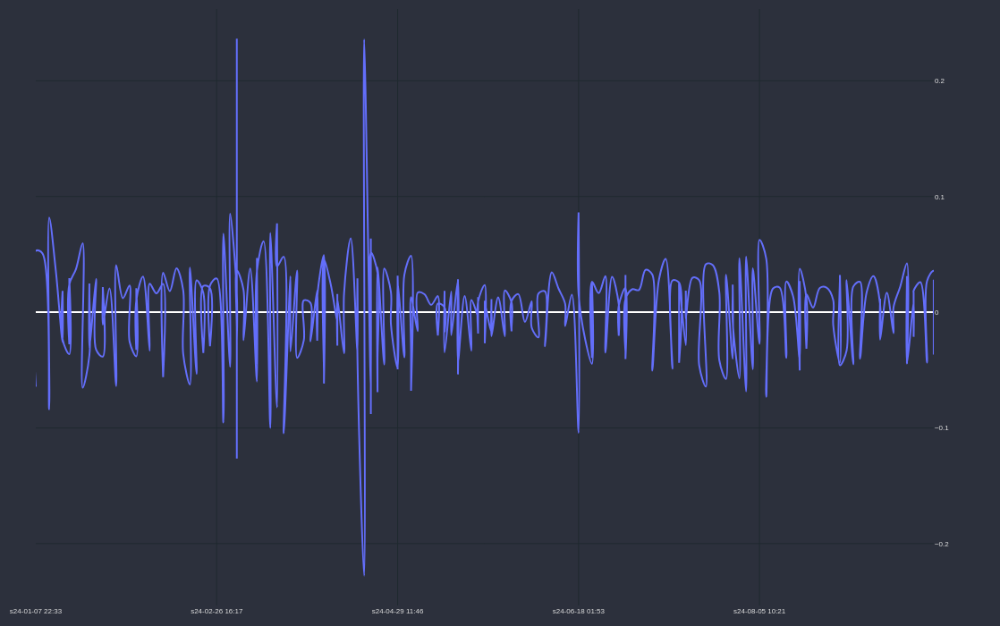

In [20]:
df_result['time'] = df_result['end_time']
cp = CandlePlot(df_result,candles=False)
cp.show_plot(height=700, width=1100, sec_traces=['strategy'])

In [21]:
df_result.sort_values(by='start_time').head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,start_price,trigger_price,type,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time
0,False,1711,1285,5,-0.064366,-0.063566,2,False,0.5277,0.4952,buy,5,0,-0.0325,2024-01-07 22:33:00,2024-01-07 01:09:00,2024-01-07 22:33:00
1,False,1794,1202,5,0.053055,0.053855,2,False,0.5226,0.4952,sell,0,5,0.0274,2024-01-07 22:33:00,2024-01-07 02:32:00,2024-01-07 22:33:00
2,False,3816,427,5,0.050875,0.051675,1,False,0.5110,0.5381,buy,5,0,0.0271,2024-01-08 19:20:00,2024-01-08 12:14:00,2024-01-08 19:20:00
3,False,5416,1866,5,-0.084064,-0.083264,2,False,0.5102,0.5545,sell,0,5,-0.0443,2024-01-10 21:59:00,2024-01-09 14:54:00,2024-01-10 21:59:00
4,False,7085,197,5,0.081876,0.082676,2,False,0.5105,0.5545,buy,5,0,0.0440,2024-01-10 21:59:00,2024-01-10 18:43:00,2024-01-10 21:59:00


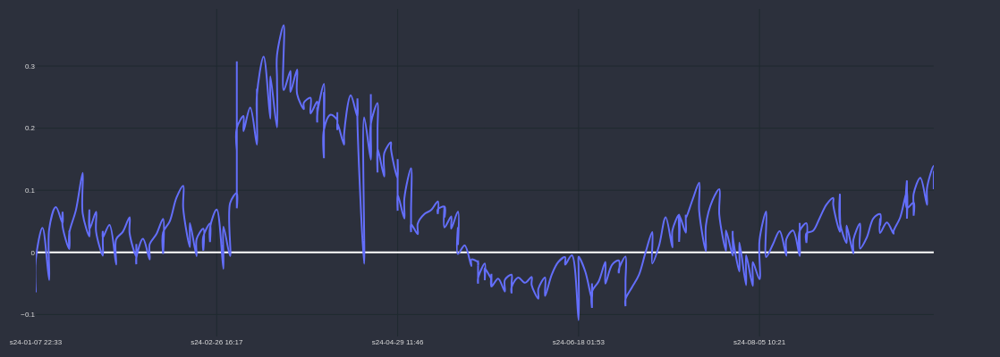

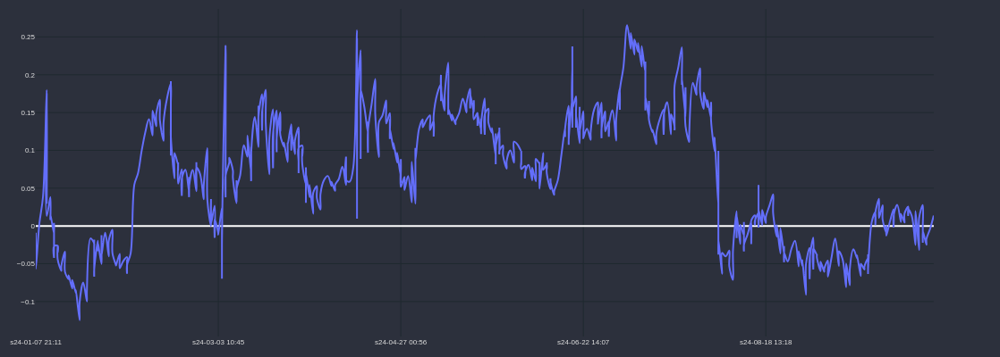

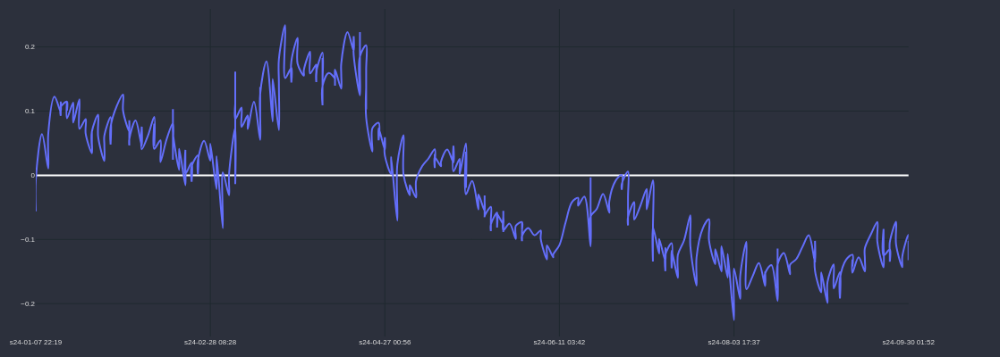

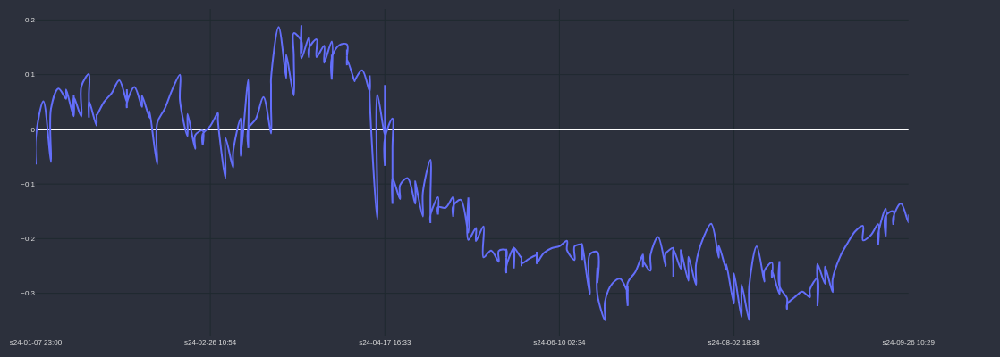

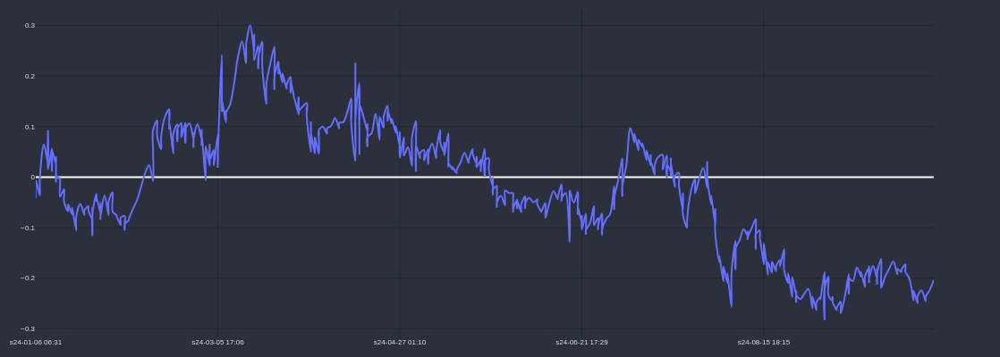

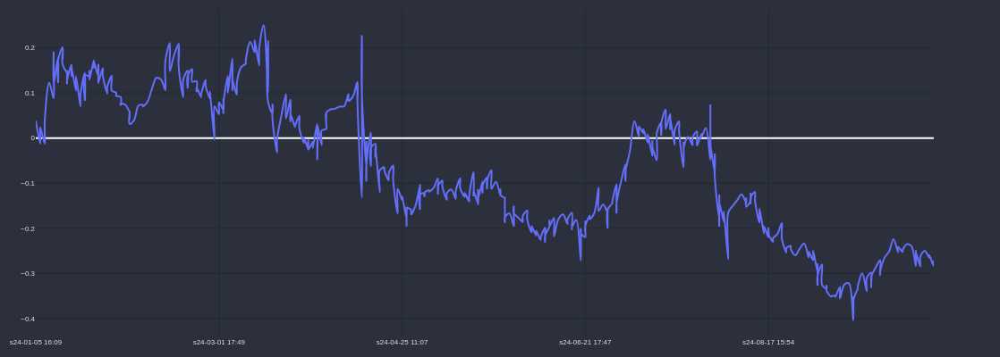

In [22]:
for i in range(len(df_res_test)):
    df_result1 = df_res_test.iloc[i].r
    df_result1['time'] = df_result1['end_time']
    df_result1['gain'] = df_result1['strategy'].cumsum()
    cp = CandlePlot(df_result1,candles=False)
    cp.show_plot(line_traces=['gain'])

In [23]:
# ddf = lista[3]['res'].df.copy()
# ddf = lista[0]['res'].copy()
ddf = df_res_test.iloc[0]['df'].copy()
ddf.columns

Index(['Time', 'Open', 'High', 'Low', 'Close', 'Volume', 'time', 'strategy',
       'returns', 'creturns', 'Log_Returns', 'cLog_Returns', 'EMA_short',
       'EMA_long', 'Percent_Change_1', 'EMA_percent_s_1', 'Percent_Change_10',
       'EMA_percent_s_10', 'Percent_Change_50', 'EMA_percent_s_50',
       'Percent_Change_150', 'EMA_percent_s_150', 'Percent_Change_200',
       'EMA_percent_s_200', 'Average_EMA_percent',
       'Average_EMA_percent_ema_short', 'Average_EMA_percent_ema_long',
       'Average_EMA_percent_ema_1', 'Average_EMA_percent_ema_5',
       'Average_EMA_percent_ema_50', 'Average_EMA_percent_ema_100',
       'donchian_high', 'donchian_low', 'donchian_mid', 'donchian_75',
       'donchian_87', 'donchian_62', 'donchian_25', 'donchian_37',
       'donchian_12', '+DI', '-DI', 'ADX', 'RSI', 'SIGNAL_UP', 'SIGNAL_DOWN'],
      dtype='object')

In [24]:
df_result[df_result['strategy'] < 0].head()


,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,start_price,trigger_price,type,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,gain
0,False,1711,1285,5,-0.064366,-0.063566,2,False,0.5277,0.4952,buy,5,0,-0.0325,2024-01-07 22:33:00,2024-01-07 01:09:00,2024-01-07 22:33:00,-0.064366
3,False,5416,1866,5,-0.084064,-0.083264,2,False,0.5102,0.5545,sell,0,5,-0.0443,2024-01-10 21:59:00,2024-01-09 14:54:00,2024-01-10 21:59:00,-0.044501
6,False,12103,826,5,-0.025875,-0.025075,3,False,0.5492,0.5356,buy,5,0,-0.0136,2024-01-14 20:06:00,2024-01-14 06:21:00,2024-01-14 20:06:00,0.046934
8,False,12815,114,5,-0.023505,-0.022705,3,False,0.5479,0.5356,buy,5,0,-0.0123,2024-01-14 20:06:00,2024-01-14 18:13:00,2024-01-14 20:06:00,0.041860
9,False,13427,4370,5,-0.036302,-0.035502,4,False,0.5390,0.5202,buy,5,0,-0.0188,2024-01-18 05:14:00,2024-01-15 04:25:00,2024-01-18 05:14:00,0.005558


In [26]:
df_up = df_result[df_result['SIGNAL_UP'] != 0]
df_down = df_result[df_result['SIGNAL_DOWN'] != 0]

print(df_up.strategy.sum())
print(df_down.strategy.sum())

df_high = df_result[df_result['SIGNAL_UP'] == 1]
df_75 = df_result[df_result['SIGNAL_UP'] == 5]
df_low = df_result[df_result['SIGNAL_DOWN'] == 5]
df_25 = df_result[df_result['SIGNAL_DOWN'] == 7]

print(df_high.strategy.sum(),' - ', len(df_high))
print(df_75.strategy.sum(), ' - ', len(df_75))
print(df_low.strategy.sum(), ' - ', len(df_low))
print(df_25.strategy.sum(), ' - ', len(df_25))

-0.8109177925660098
0.9323105842640035
0.0  -  0
-0.8109177925660098  -  158
0.9323105842640035  -  160
0.0  -  0


7 5


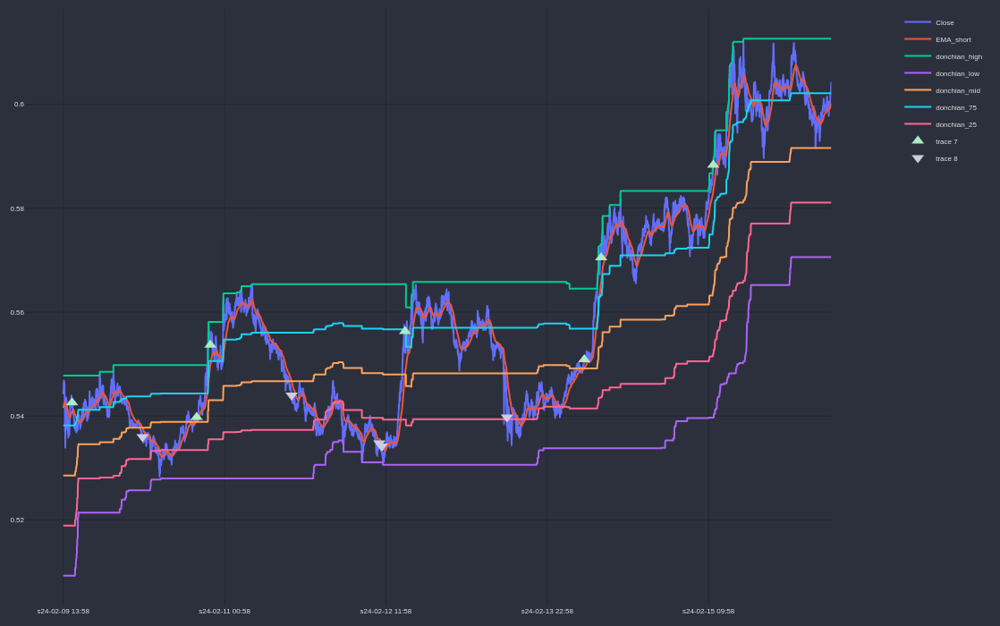

In [29]:
cp = CandlePlot(ddf.iloc[50000:60000],candles=False)

trades_up = cp.df_plot[(cp.df_plot['SIGNAL_UP'] == 5) | (cp.df_plot['SIGNAL_UP'] == 1)]
trades_down = cp.df_plot[(cp.df_plot['SIGNAL_DOWN'] == 5) | (cp.df_plot['SIGNAL_DOWN'] == 9)]


print(len(trades_up),len(trades_down))



marker_trade_up = '#abebc6'
marker_trade_down = '#cccddd'


markers = 'Close'


cp.add_traces(['Close','EMA_short','donchian_high','donchian_low','donchian_mid','donchian_75','donchian_25'])


# # SIGNAL UP
cp.fig.add_trace(go.Scatter(
    x = trades_up.sTime,
    y = trades_up[markers],
    mode = 'markers',
    marker_symbol = 'triangle-up',
    marker=dict(color=marker_trade_up, size=12)
))

cp.fig.add_trace(go.Scatter(
    x = trades_down.sTime,
    y = trades_down[markers],
    mode = 'markers',
    marker_symbol = 'triangle-down',
    marker=dict(color=marker_trade_down, size=12)
))

sec_traces=['EMA_percent_s_10']
cp.show_plot(height=700, width=1100)

In [36]:
# cp = CandlePlot(ddf.iloc[0:50000],candles=False, is_subplots=False)

# cp.add_traces(['Close','High','Low'])
# cp.show_plot(height=700, width=1100, sec_traces=['Average_EMA_percent','Average_EMA_percent_ema_short','Average_EMA_percent_ema_long'])

In [30]:
df_result.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'total_opened', 'first_return', 'trail_stop', 'trail_stop_target',
       'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN', 'result',
       'end_time', 'start_time'],
      dtype='object')

In [31]:
df_result[df_result['start_time'] == '2024-09-27 02:33:00']

,running,start_index_m5,count,trigger_type,strategy,total_opened,first_return,trail_stop,trail_stop_target,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
344,False,193394,6,1,-0.000942,6,False,1,0,64968.21,64906.97,1,0,0.0,2024-09-27 02:38:00,2024-09-27 02:33:00


In [32]:
df = res[0]['res'].df
df.columns

Index(['Time', 'Open', 'High', 'Low', 'Close', 'Volume', 'time', 'strategy',
       'returns', 'creturns', 'Log_Returns', 'cLog_Returns', 'EMA_short',
       'EMA_long', 'diff_close_ema_log', 'norm_diff_close_ema_log',
       'diff_abs_close_ema_log', 'norm_diff_abs_close_ema_log',
       'Percent_Change', 'EMA_percent_s', 'EMA_percent_l',
       'norm_EMA_percent_s', 'SIGNAL_UP', 'SIGNAL_DOWN'],
      dtype='object')

In [33]:
index = df[df['time']=='2024-09-27 02:33:00'].index[0]
print(index)

193394


In [34]:
df_test = df.iloc[index:index+20]
df_test['strategy'] = df_test.returns.cumsum()
df_test['strategy2'] = (1 + df_test['returns']).cumprod() - 1
df_test[['Time', 'Close', 'Volume', 'strategy','strategy2','returns']]

,Time,Close,Volume,strategy,strategy2,returns
193394,2024-09-27 02:33:00,64968.21,17.29385,0.000896,0.000896,8.962242e-04
193395,2024-09-27 02:34:00,64970.52,2.89256,0.000932,0.000932,3.555522e-05
193396,2024-09-27 02:35:00,64978.01,4.99901,0.001047,0.001047,1.152764e-04
193397,2024-09-27 02:36:00,64968.25,9.78177,0.000897,0.000897,-1.502159e-04
193398,2024-09-27 02:37:00,64953.33,4.92568,0.000667,0.000667,-2.296770e-04
193399,2024-09-27 02:38:00,64906.97,11.18005,-0.000047,-0.000048,-7.139981e-04
193400,2024-09-27 02:39:00,64919.99,5.39510,0.000154,0.000153,2.005747e-04
193401,2024-09-27 02:40:00,64966.00,22.77322,0.000862,0.000862,7.084675e-04
193402,2024-09-27 02:41:00,64962.00,14.08988,0.000801,0.000800,-6.157256e-05
193403,2024-09-27 02:42:00,64962.01,3.24415,0.000801,0.000800,1.539361e-07


In [33]:
result = df_test['Close'].iloc[-1] - df_test['Close'].iloc[0]
round(result,4)

np.float64(-0.0002)